In [195]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

In [196]:
def squarify(image, size=512, color=(0, 0, 0)):
    ratio = float(size) / np.max(image.shape[:2])
    h, w, c = image.shape
    max = np.max([h, w])
    image_size_max = np.max(image.shape[:2])
    result = np.full((max, max, c), color, dtype=np.uint8)
    center_y = (result.shape[1] - h) // 2
    center_x = (result.shape[0] - w) // 2
    result[center_y:center_y + image.shape[0],
           center_x:center_x + image.shape[1]] = image
    result = cv2.resize(result, (size, size), cv2.INTER_AREA if max > size else cv2.INTER_CUBIC)
    return result

0 / 360           
1 / 360           
2 / 360           
3 / 360           
4 / 360           
5 / 360           
6 / 360           
7 / 360           
8 / 360           
9 / 360           
10 / 360           
11 / 360           
12 / 360           
13 / 360           
14 / 360           
15 / 360           
16 / 360           
17 / 360           
18 / 360           
19 / 360           
20 / 360           


C:\Users\larsr\AppData\Local\Temp\ipykernel_12744\2592311605.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10, 10), dpi=200)


21 / 360           
22 / 360           
23 / 360           
24 / 360           
25 / 360           
26 / 360           
27 / 360           
28 / 360           
29 / 360           
30 / 360           
31 / 360           
32 / 360           
33 / 360           
34 / 360           
35 / 360           
36 / 360           
37 / 360           
38 / 360           
39 / 360           
40 / 360           
41 / 360           
42 / 360           
43 / 360           
44 / 360           
45 / 360           
46 / 360           
47 / 360           
48 / 360           
49 / 360           
50 / 360           
51 / 360           
52 / 360           
53 / 360           
54 / 360           
55 / 360           
56 / 360           
57 / 360           
58 / 360           
59 / 360           
60 / 360           
61 / 360           
62 / 360           
63 / 360           
64 / 360           
65 / 360           
66 / 360           
67 / 360           
68 / 360           
69 / 360           
70 / 360           


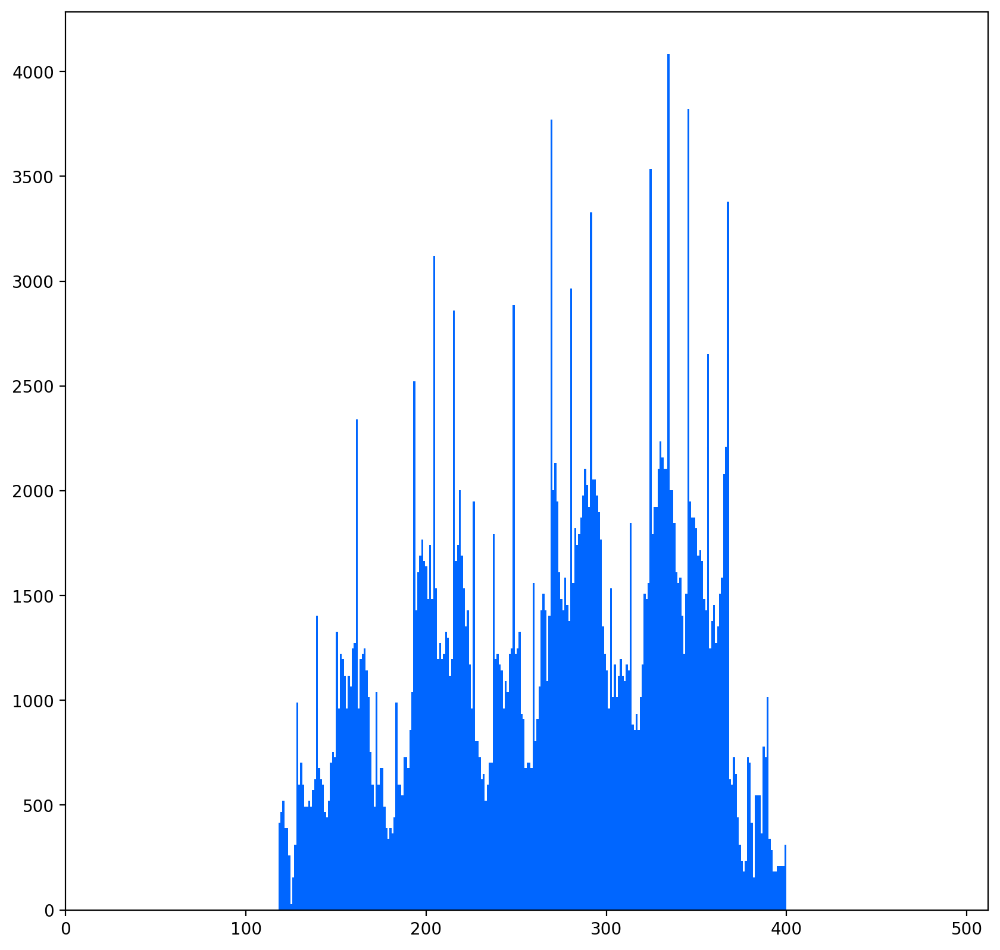

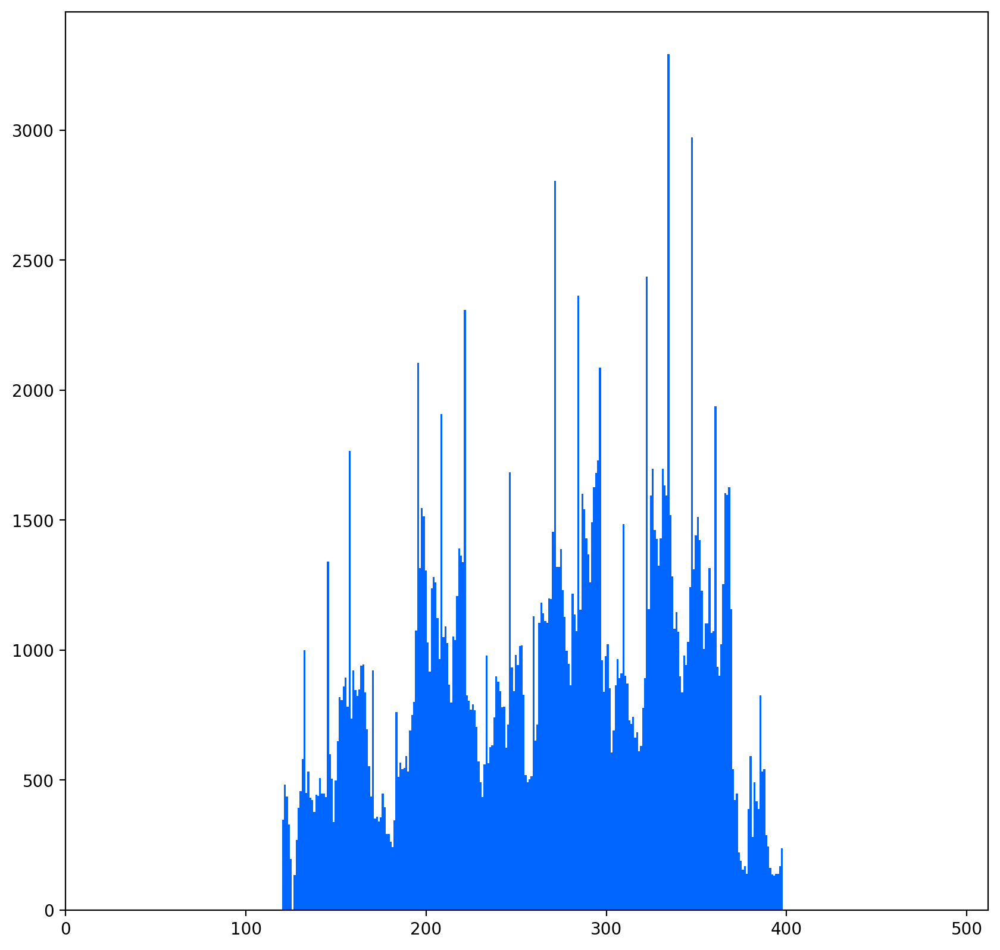

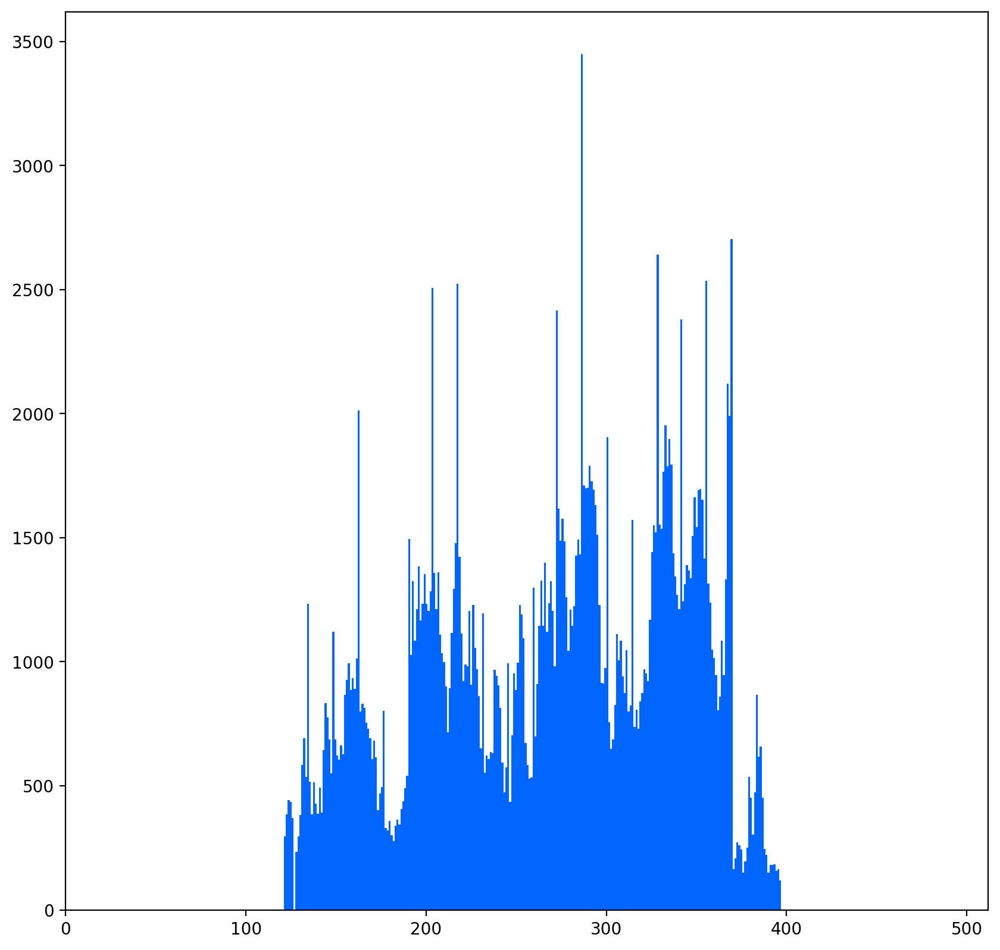

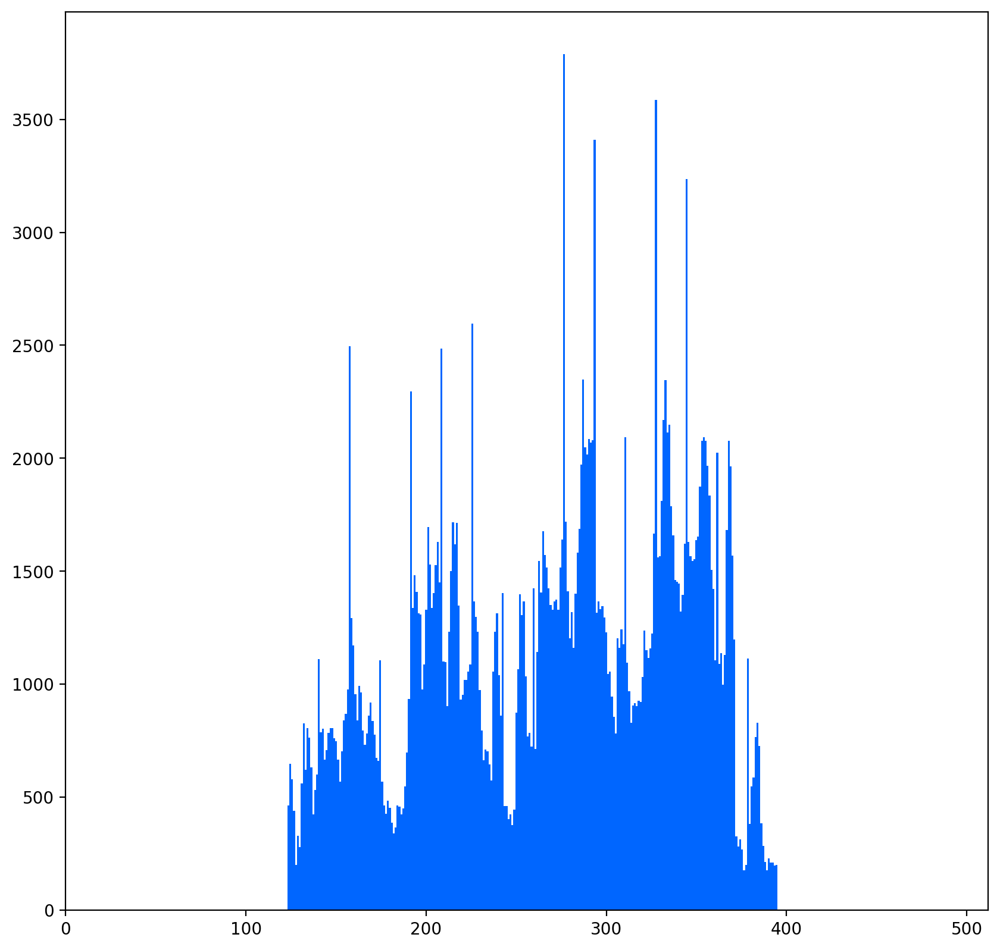

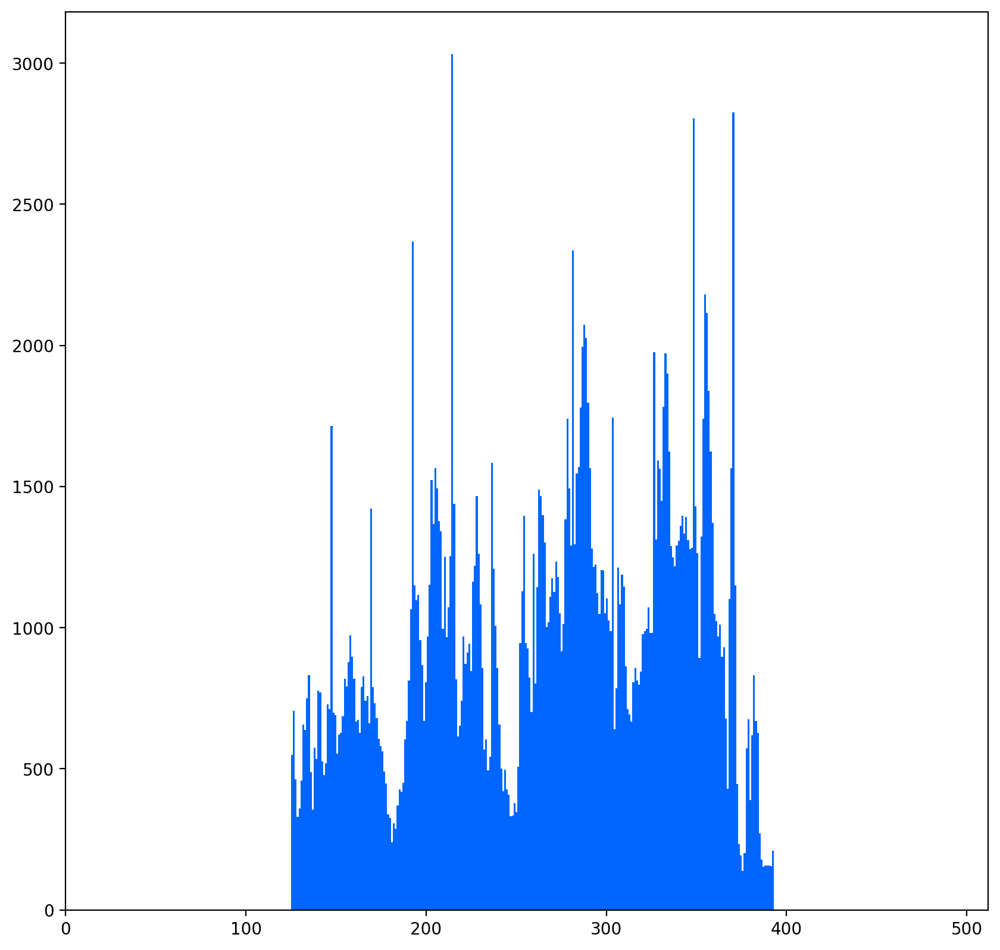

...

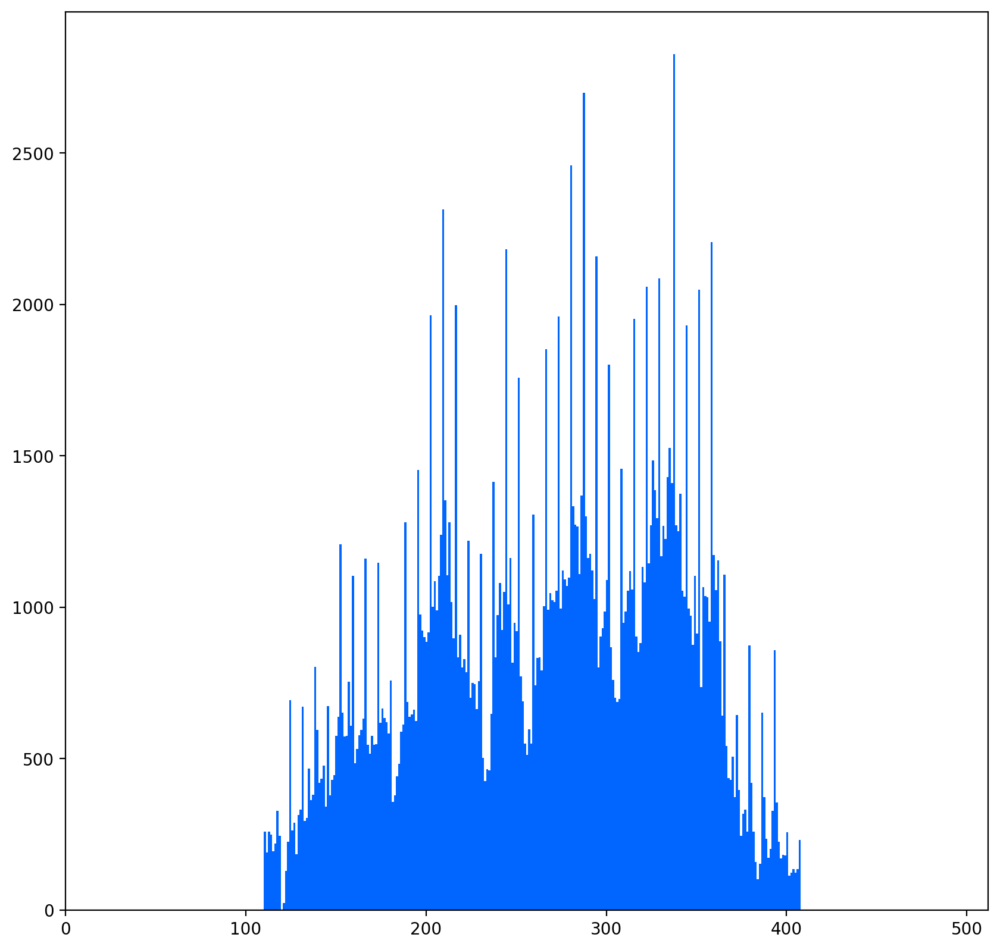

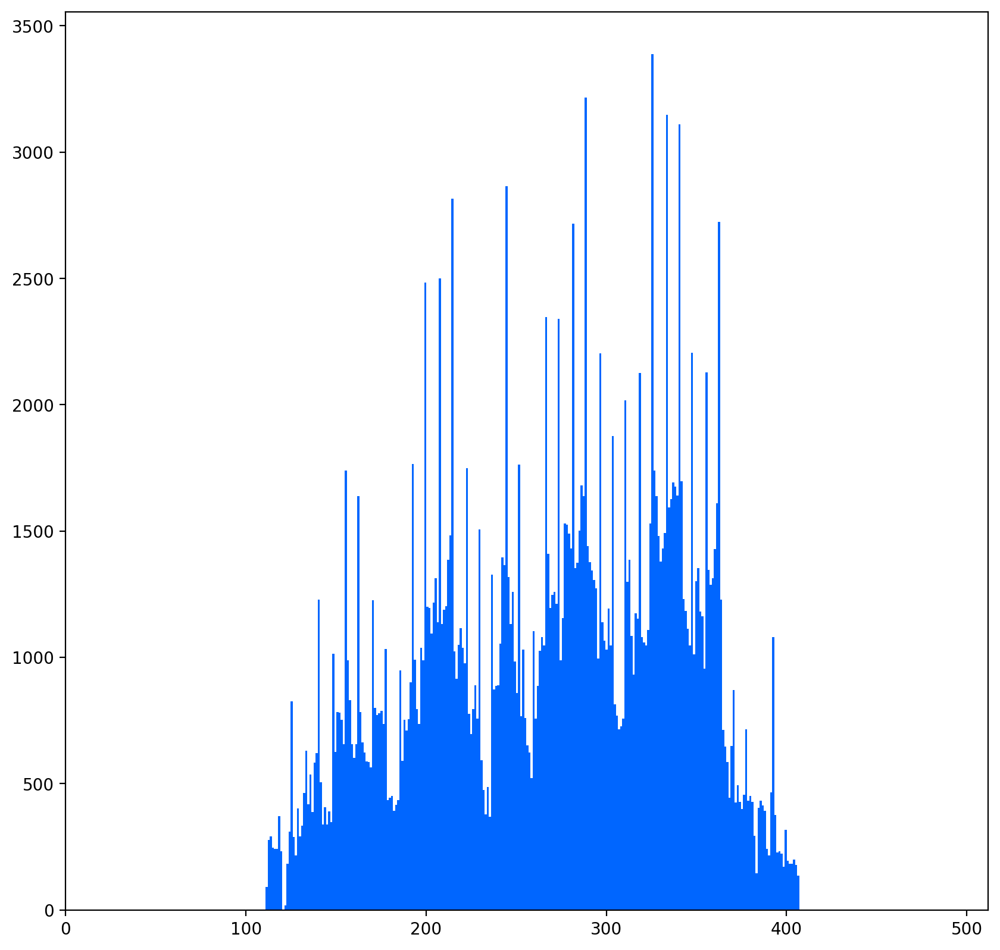

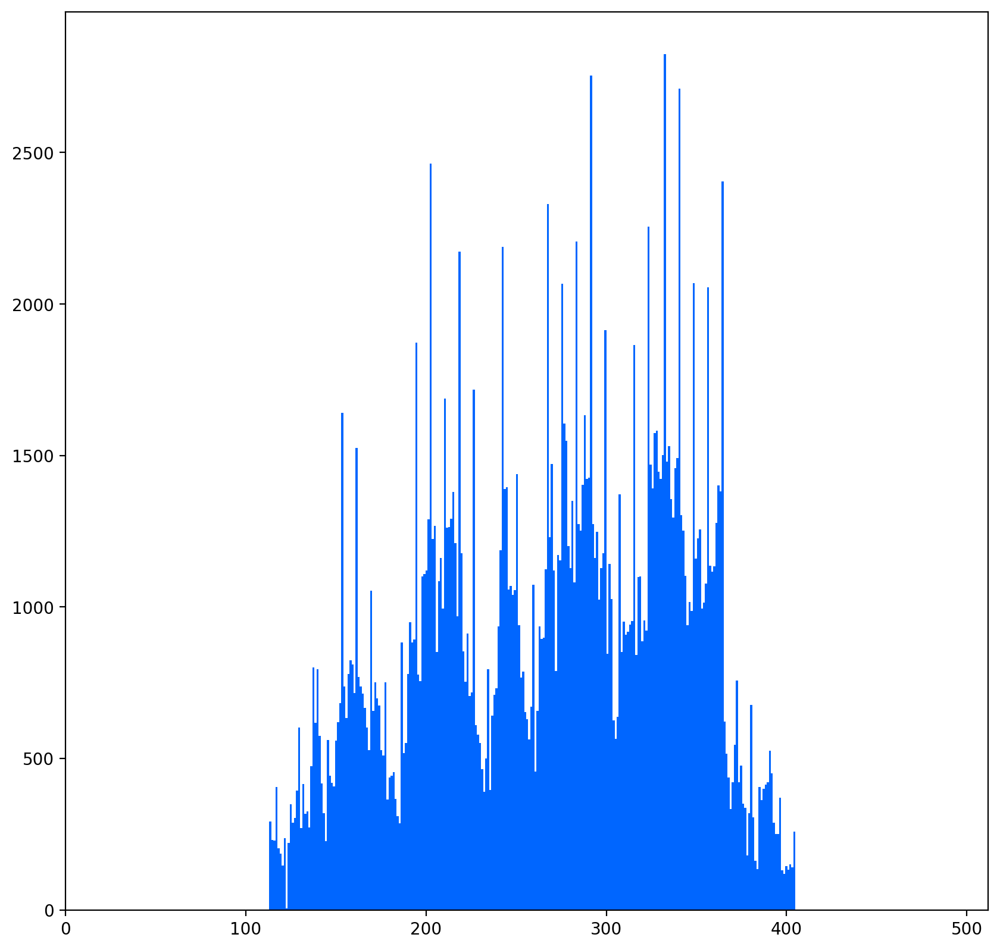

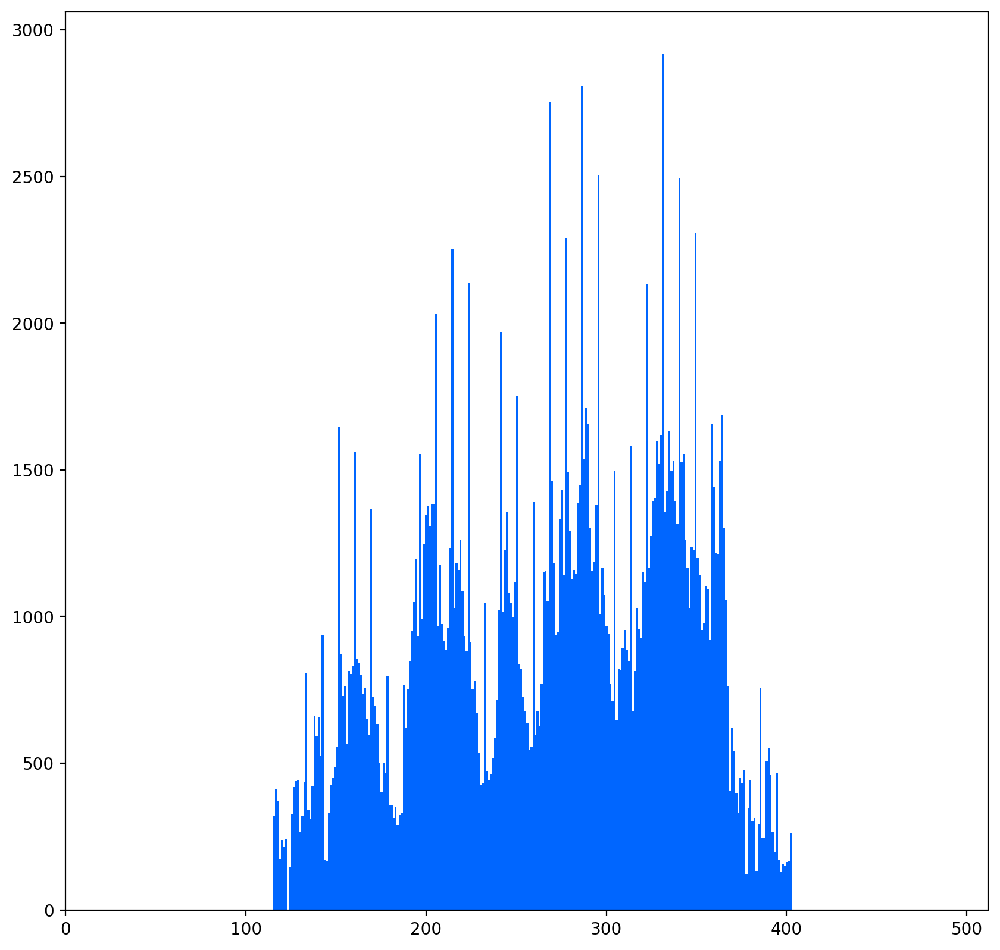

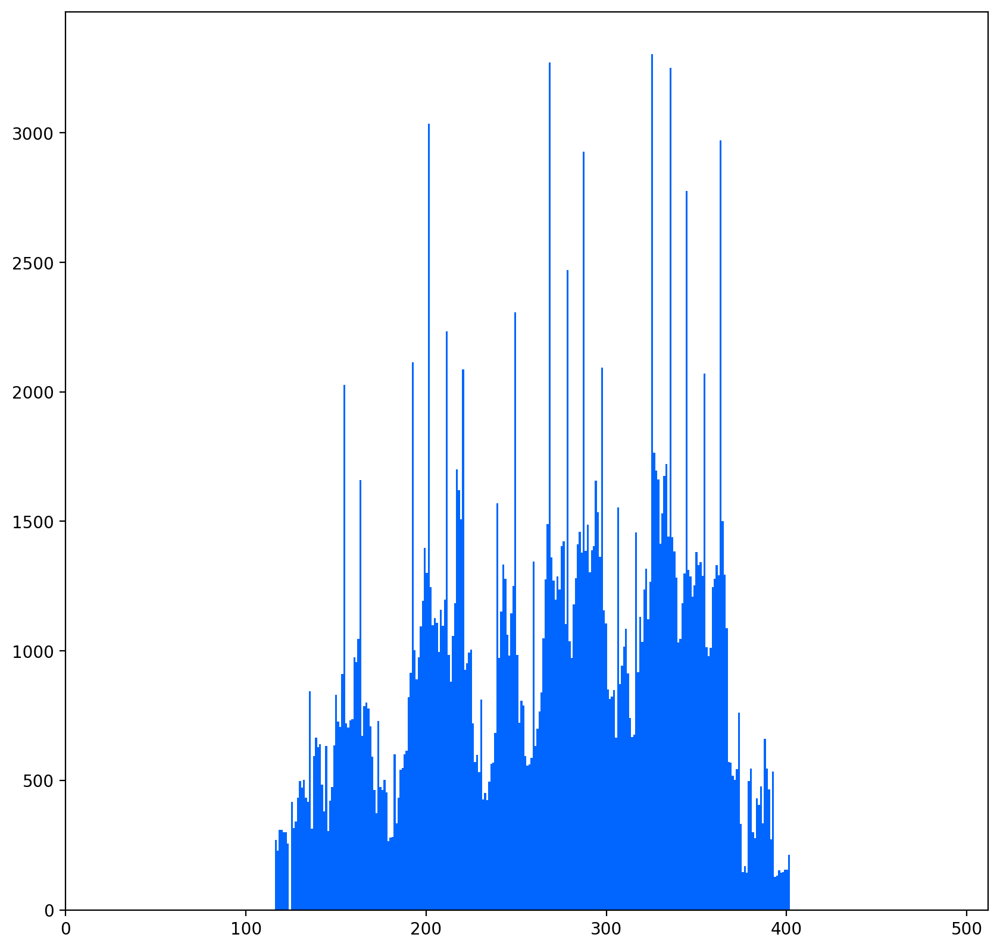

In [198]:
for angle in range(0, 360):
    print("{} / 360           \r".format(angle))
    image = cv2.imread('dataset/6.jpg')
    size = 512
    image = squarify(image, size)
    image = cv2.GaussianBlur(image, (3, 3), 2, 2)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image_equalized = image.copy()
    cv2.equalizeHist(image, image_equalized)
    _, image_threshold = cv2.threshold(image_equalized, 20, 255, cv2.THRESH_BINARY_INV)
    image_threshold = cv2.cvtColor(image_threshold, cv2.COLOR_GRAY2BGR)
    cv2.floodFill(image_threshold, None, (0, 0), (0, 0, 0))
    cv2.floodFill(image_threshold, None, (size-1, size-1), (0, 0, 0))
    image_threshold = cv2.cvtColor(image_threshold, cv2.COLOR_BGR2GRAY)

    image_center = tuple(np.array(image_threshold.shape[1::-1]) / 2)
    rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
    image_threshold = cv2.warpAffine(image_threshold, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)

    white_pixels = np.argwhere(image_threshold[image_threshold] == 255)

    # plt.figure(dpi=200)
    # img_plot = cv2.cvtColor(image_threshold, cv2.COLOR_BGR2RGB)
    # plt.imshow(img_plot)
    # plt.axis('off')

    fig = plt.figure(figsize=(10, 10), dpi=200)
    fig.set_facecolor('white')
    plt.xlim((0, 512))
    plt.hist(white_pixels[:,0], bins=256, color='#0066ff')
    plt.savefig("rotating_histogram/histogram_angle_{}.png".format(str(angle).rjust(3, '0')))


In [199]:
%pip install imageio

Note: you may need to restart the kernel to use updated packages.


In [206]:
import imageio
images = []
for filename in os.listdir('rotating_histogram/'):
    images.append(imageio.imread(filename))
imageio.mimsave('movie.mp4', images)

StopIteration: 